# Machine Learning for Data Science 
# Decision Trees as Interpretable Models | The LASSO and Boosting for Regression
## Rajnandini Thopte


## 1. Decision Trees as Interpretable Models


> **Research:**
> - A decision tree is one of the most powerful tools of supervised learning algorithms used for both classification and regression tasks. 
> - It builds a flowchart-like tree structure where each internal node denotes a test on an attribute, each branch represents an outcome of the test, and each leaf node (terminal node) holds a class label. 
> - It is constructed by recursively splitting the training data into subsets based on the values of the attributes until a stopping criterion is met, such as the maximum depth of the tree or the minimum number of samples required to split a node.

#### a) Download the Accute Inflamations data from https://archive.ics.uci.edu/ml/datasets/Acute+Inflammations.

In [19]:
#Installing necessary packages 
!python -m pip install scikit-multilearn
!python -m pip install xgboost
from skmultilearn.problem_transform import LabelPowerset
from sklearn.metrics import confusion_matrix, roc_curve, auc, accuracy_score,classification_report
import xgboost as xgb

In [20]:
#Importing libraries 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import RidgeCV,Ridge
from sklearn.linear_model import LassoCV,Lasso
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
import warnings
import pprint
warnings.filterwarnings('ignore')
import math

from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import cross_val_score
from sklearn.tree import _tree

In [21]:
INFLAMMATION_DATA = '../data/diagnosis_data.csv'

For reference:  
1] a1 Temperature of patient { 35C-42C }  
2] a2 Occurrence of nausea { yes, no }  
3] a3 Lumbar pain { yes, no }  
4] a4 Urine pushing (continuous need for urination) { yes, no }  
5] a5 Micturition pains { yes, no }  
6] a6 Burning of urethra, itch, swelling of urethra outlet { yes, no }  
7] d1 decision: Inflammation of urinary bladder { yes, no }  
8] d2 decision: Nephritis of renal pelvis origin { yes, no }   

In [22]:
def get_InflammationData_file_col_name(filename):
    if "diagnosis" in filename:
        return ["a1", "a2", "a3", "a4", "a5", "a6", "d1", "d2"]

In [23]:
df = pd.read_csv(INFLAMMATION_DATA, sep='\s+', encoding='UTF_16', header=None, decimal=',')
df.columns = get_InflammationData_file_col_name(INFLAMMATION_DATA)
df

,a1,a2,a3,a4,a5,a6,d1,d2
0,35.5,no,yes,no,no,no,no,no
1,35.9,no,no,yes,yes,yes,yes,no
2,35.9,no,yes,no,no,no,no,no
3,36.0,no,no,yes,yes,yes,yes,no
4,36.0,no,yes,no,no,no,no,no
...,...,...,...,...,...,...,...,...
115,41.4,no,yes,yes,no,yes,no,yes
116,41.5,no,no,no,no,no,no,no
117,41.5,yes,yes,no,yes,no,no,yes
118,41.5,no,yes,yes,no,yes,no,yes


In [24]:
# The function returns the DataFrame with 'no' and 'yes' values converted to 0 and 1, respectively.
# However, there is an issue with the last line "df" without an assignment; it should be removed.

def get_numeric_labelled_InflammationData(df):
    # Get the column names from the get_InflammationData_file_col_name function
    cols = get_InflammationData_file_col_name(INFLAMMATION_DATA)
    
    # Iterate through each column name
    for col in cols:
        # For each column, locate all rows where the value is 'no' and replace it with 0
        df.loc[df[col] == 'no', col] = 0
        # For the same column, locate all rows where the value is 'yes' and replace it with 1
        df.loc[df[col] == 'yes', col] = 1
    
    # Return the modified DataFrame with numeric labels
    return df

In [25]:
df = get_numeric_labelled_InflammationData(df)
df

,a1,a2,a3,a4,a5,a6,d1,d2
0,35.5,0,1,0,0,0,0,0
1,35.9,0,0,1,1,1,1,0
2,35.9,0,1,0,0,0,0,0
3,36.0,0,0,1,1,1,1,0
4,36.0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...
115,41.4,0,1,1,0,1,0,1
116,41.5,0,0,0,0,0,0,0
117,41.5,1,1,0,1,0,0,1
118,41.5,0,1,1,0,1,0,1


#### (b) Build a decision tree on the whole data set and plot it.

In the get_data_X_Y_split function below, I am splitting the DataFrame into three parts: dataX for features, dataY1 for the first target variable (d1), and dataY2 for the second target variable (d2).

After this data split, we can train separate decision trees for each target variable using trainX as the feature data and trainY1 for the first decision tree and trainY2 for the second decision tree.

This approach is suitable since we have multiple target variables, and we want to build separate models for each target variable. It allows us to create decision trees that predict d1 and d2 independently based on the same set of features.

In [26]:
def get_data_X_Y_split(df):
    # Slice the DataFrame to get features (all columns except the last two)
    dataX = df.iloc[:, :-2]

    # Slice the DataFrame to get the first target variable (the second-to-last column)
    dataY1 = df.iloc[:, -2:-1]

    # Slice the DataFrame to get the second target variable (the last column)
    dataY2 = df.iloc[:, -1:]

    # Convert the data in dataY1 to integer type
    dataY1 = dataY1.astype('int')

    # Convert the data in dataY2 to integer type
    dataY2 = dataY2.astype('int')

    # Return the features and target variables
    return dataX, dataY1, dataY2

# Call the function to split the data
trainX, trainY1, trainY2 = get_data_X_Y_split(df)

# Print the shapes of the resulting arrays
print("Shape for trainX: ", trainX.shape)
print("Shape for trainY1: ", trainY1.shape)
print("Shape for trainY2: ", trainY2.shape)


Shape for trainX:  (120, 6)
Shape for trainY1:  (120, 1)
Shape for trainY2:  (120, 1)


In [27]:
def get_decision_tree_text_rep_and_plot(dataX, dataY):
    # Create a DecisionTreeClassifier instance with a specified random state
    classifier = DecisionTreeClassifier(random_state=69)
    
    # Fit the decision tree model on the input data (dataX) and target variable (dataY)
    model = classifier.fit(dataX, dataY)
    
    # Generate a text representation of the decision tree
    text = tree.export_text(classifier)
    
    # Print the text representation of the decision tree
    print("DECISION TREE: TEXT REPRESENTATION")
    print(text)
    
    # Print a graphical plot of the decision tree with filled nodes
    print("DECISION TREE: PLOT")
    tree.plot_tree(classifier, filled=True)
    
    # Return the trained decision tree classifier
    return classifier


DECISION TREE: TEXT REPRESENTATION
|--- feature_3 <= 0.50
|   |--- class: 0
|--- feature_3 >  0.50
|   |--- feature_4 <= 0.50
|   |   |--- feature_2 <= 0.50
|   |   |   |--- class: 1
|   |   |--- feature_2 >  0.50
|   |   |   |--- class: 0
|   |--- feature_4 >  0.50
|   |   |--- class: 1

DECISION TREE: PLOT


DecisionTreeClassifier(random_state=69)

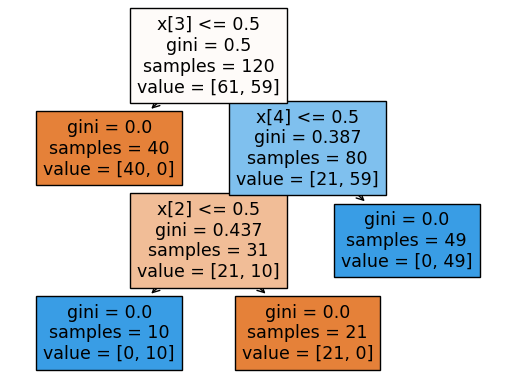

In [28]:
get_decision_tree_text_rep_and_plot(trainX, trainY1)

DECISION TREE: TEXT REPRESENTATION
|--- feature_0 <= 37.95
|   |--- class: 0
|--- feature_0 >  37.95
|   |--- feature_2 <= 0.50
|   |   |--- class: 0
|   |--- feature_2 >  0.50
|   |   |--- class: 1

DECISION TREE: PLOT


DecisionTreeClassifier(random_state=69)

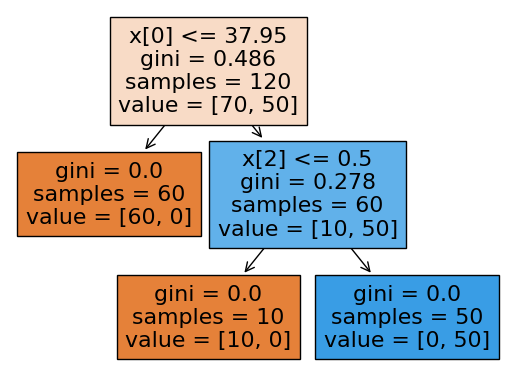

In [29]:
get_decision_tree_text_rep_and_plot(trainX, trainY2)

DECISION TREE: TEXT REPRESENTATION
|--- feature_0 <= 37.95
|   |--- feature_3 <= 0.50
|   |   |--- class: 0
|   |--- feature_3 >  0.50
|   |   |--- class: 1
|--- feature_0 >  37.95
|   |--- feature_2 <= 0.50
|   |   |--- class: 0
|   |--- feature_2 >  0.50
|   |   |--- feature_4 <= 0.50
|   |   |   |--- class: 0
|   |   |--- feature_4 >  0.50
|   |   |   |--- feature_3 <= 0.50
|   |   |   |   |--- class: 0
|   |   |   |--- feature_3 >  0.50
|   |   |   |   |--- class: 0

DECISION TREE: PLOT


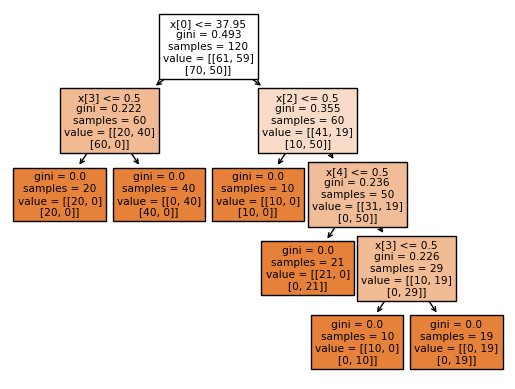

In [30]:
trainX = df.iloc[:, 0:6]
trainY = df.iloc[:, 6:]
trainY = trainY.astype('int')

classifier = get_decision_tree_text_rep_and_plot(trainX, trainY)

#### (c) Convert the decision rules into a set of IF-THEN rules.

In [31]:
#Formats the values associated with leaf nodes in a decision tree into a readable string format.
def format_tree_values(value):
    ans = "["
    for row in value:
        ans += ' ['
        for col in row:
            ans += str(col) + ' '
        ans = ans[:-1] + ']'
    ans += ' ]'
    return ans

#Generates Python code to represent the structure of a decision tree and its associated rules based on the 
#input decision tree model and feature names.
def generate_decision_tree_code(decision_tree, features):
    feature_names = features  # Use the provided feature names

    print("def tree({}):".format(", ".join(features)))
    def recurse(node, depth):
        indent = "  " * depth
        if decision_tree.tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_names[decision_tree.tree_.feature[node]]
            threshold = decision_tree.tree_.threshold[node]
            print("{}if {} <= {}:".format(indent, name, threshold))
            recurse(decision_tree.tree_.children_left[node], depth + 1)
            print("{}else:".format(indent))
            recurse(decision_tree.tree_.children_right[node], depth + 1)
        else:
            print("{}return {}".format(indent, format_tree_values(decision_tree.tree_.value[node])))
    recurse(0, 1)


In [32]:
features_names = ['temperature', 'nausea_occurence', 'lumbar_pain', 'urine_pushing', 'micturition_pains', 'burning_urethra']
generate_decision_tree_code(classifier, features_names)

def tree(temperature, nausea_occurence, lumbar_pain, urine_pushing, micturition_pains, burning_urethra):
  if temperature <= 37.95000076293945:
    if urine_pushing <= 0.5:
      return [ [20.0 0.0] [20.0 0.0] ]
    else:
      return [ [0.0 40.0] [40.0 0.0] ]
  else:
    if lumbar_pain <= 0.5:
      return [ [10.0 0.0] [10.0 0.0] ]
    else:
      if micturition_pains <= 0.5:
        return [ [21.0 0.0] [0.0 21.0] ]
      else:
        if urine_pushing <= 0.5:
          return [ [10.0 0.0] [0.0 10.0] ]
        else:
          return [ [0.0 19.0] [0.0 19.0] ]


#### (d) Use cost-complexity pruning to find a minimal decision tree and a set of decision rules with high interpretability.


Cost complexity pruning provides another option to control the size of a tree. In DecisionTreeClassifier , this pruning technique is parameterized by the cost complexity parameter, ccp_alpha . Greater values of ccp_alpha increase the number of nodes pruned.

In [33]:
"""max_depth is a hyperparameter that represents the maximum depth of a decision tree, 
and it is common to experiment with different depths to determine the best value for a specific dataset."""

# Define a function to generate a list of pruning parameters
def get_parameters_for_pruning():
    ans = []  # Create an empty list to store the pruning parameters
    for i in range(10):  # Loop from 0 to 9 (inclusive)
        ans.append(int((i + 1) / 10))  # Calculate a parameter value, convert it to an integer, and add it to the list
    return ans  # Return the list of pruning parameters

# Define a function to find the best score, hyperparameters, and model using GridSearchCV
def get_best_score_and_params():
    parameters = {'max_depth': get_parameters_for_pruning()}  # Create a dictionary with 'max_depth' as the key and a list of pruning parameters as the value
    classifier = GridSearchCV(DecisionTreeClassifier(random_state=50), parameters)  # Create a DecisionTreeClassifier and use GridSearchCV for hyperparameter tuning
    classifier.fit(trainX, trainY)  # Fit the classifier to the training data
    accurate_model = classifier.best_estimator_  # Get the best estimator (model) found by GridSearchCV
    return {
        'best_score': round(classifier.best_score_, 4),  # Calculate and round the best score to four decimal places
        'best_params': classifier.best_params_,  # Get the best hyperparameters
        'accurate_model': accurate_model  # Store the best model
    }

# Call the function to find the best score, hyperparameters, and model
best_score_and_params_with_accurate_model = get_best_score_and_params()

# Extract the best score from the result
best_score = best_score_and_params_with_accurate_model['best_score']

# Extract the best hyperparameters from the result
best_params = best_score_and_params_with_accurate_model['best_params']

# Extract the best model from the result
accurate_model = best_score_and_params_with_accurate_model['accurate_model']

# Print the best score
print(f"Best Score is: {best_score}")

# Print the best hyperparameters
print(f"Best Parameter is: {best_params}")


Best Score is: 0.5417
Best Parameter is: {'max_depth': 1}


In [34]:
# Split the dataset into training and testing sets (80% training, 20% testing)
X_train, X_test, Y_train, Y_test = train_test_split(trainX, trainY, test_size=0.20)

Train Accuracy = 1.0
Test Accuracy = 1.0


[Text(0.4, 0.9, 'x[0] <= 37.95\ngini = 0.491\nsamples = 96\nvalue = [[47, 49]\n[57, 39]]'),
 Text(0.2, 0.7, 'x[3] <= 0.5\ngini = 0.215\nsamples = 48\nvalue = [[15, 33]\n[48, 0]]'),
 Text(0.1, 0.5, 'gini = 0.0\nsamples = 15\nvalue = [[15, 0]\n[15, 0]]'),
 Text(0.3, 0.5, 'gini = 0.0\nsamples = 33\nvalue = [[0, 33]\n[33, 0]]'),
 Text(0.6, 0.7, 'x[2] <= 0.5\ngini = 0.375\nsamples = 48\nvalue = [[32, 16]\n[9, 39]]'),
 Text(0.5, 0.5, 'gini = 0.0\nsamples = 9\nvalue = [[9, 0]\n[9, 0]]'),
 Text(0.7, 0.5, 'x[4] <= 0.5\ngini = 0.242\nsamples = 39\nvalue = [[23, 16]\n[0, 39]]'),
 Text(0.6, 0.3, 'gini = 0.0\nsamples = 15\nvalue = [[15, 0]\n[0, 15]]'),
 Text(0.8, 0.3, 'x[3] <= 0.5\ngini = 0.222\nsamples = 24\nvalue = [[8, 16]\n[0, 24]]'),
 Text(0.7, 0.1, 'gini = 0.0\nsamples = 8\nvalue = [[8, 0]\n[0, 8]]'),
 Text(0.9, 0.1, 'gini = 0.0\nsamples = 16\nvalue = [[0, 16]\n[0, 16]]')]

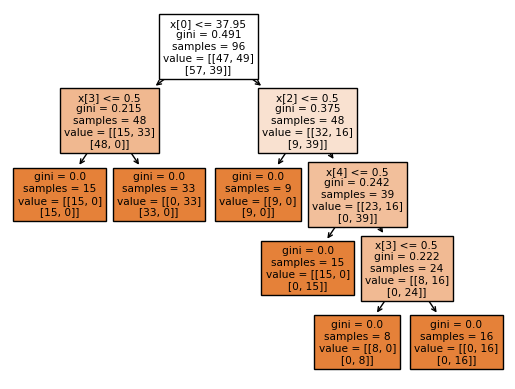

In [35]:
# Set the initial value for the best alpha to 0.0
best_alpha = 0.0

# Create a Decision Tree classifier with random state and ccp_alpha set to the best alpha
best_classifier = DecisionTreeClassifier(random_state=50, ccp_alpha=best_alpha)

# Create a LabelPowerset classifier using the best Decision Tree classifier
best_c = LabelPowerset(best_classifier)

# Fit the best classifier to the training data
best_classifier.fit(X_train, Y_train)

# Predict labels for the training set
Y_train_pred = best_classifier.predict(X_train)

# Predict labels for the test set
Y_test_pred = best_classifier.predict(X_test)

# Print the training accuracy
print(f"Train Accuracy = {accuracy_score(Y_train, Y_train_pred)}")

# Print the test accuracy
print(f"Test Accuracy = {accuracy_score(Y_test, Y_test_pred)}")

# Plot the decision tree with filled nodes
tree.plot_tree(best_classifier, filled=True)


In [36]:
generate_decision_tree_code(best_classifier, features_names)

def tree(temperature, nausea_occurence, lumbar_pain, urine_pushing, micturition_pains, burning_urethra):
  if temperature <= 37.95000076293945:
    if urine_pushing <= 0.5:
      return [ [15.0 0.0] [15.0 0.0] ]
    else:
      return [ [0.0 33.0] [33.0 0.0] ]
  else:
    if lumbar_pain <= 0.5:
      return [ [9.0 0.0] [9.0 0.0] ]
    else:
      if micturition_pains <= 0.5:
        return [ [15.0 0.0] [0.0 15.0] ]
      else:
        if urine_pushing <= 0.5:
          return [ [8.0 0.0] [0.0 8.0] ]
        else:
          return [ [0.0 16.0] [0.0 16.0] ]


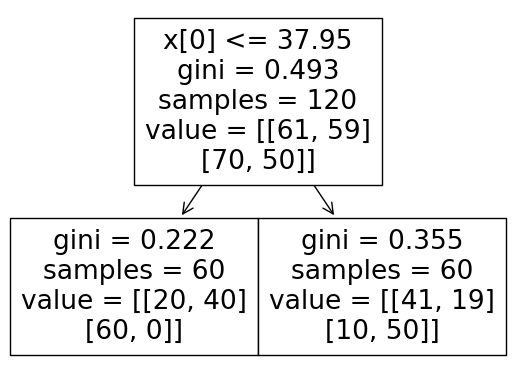

In [37]:
# Define a function to get decision rules with high interpretability
def get_decision_rules_with_high_interpretability():
    # Define the feature names
    features = ['temperature', 'nausea_occurrence', 'lumbar_pain', 'urine_pushing', 'micturition_pains', 'burning_urethra']
    
    # Define class names
    features_d1_d2 = ['inflammation_pred', 'nephritis_pred']
    
    # Export the decision tree model to DOT format (Graphviz)
    dot_data = tree.export_graphviz(accurate_model, out_file=None, 
                                    feature_names=features,  
                                    class_names=features_d1_d2,
                                    filled=True)
    
    # Plot the decision tree
    tree.plot_tree(accurate_model)
    
    # Return the feature names
    return features

# Call the function to get decision rules and feature names
features = get_decision_rules_with_high_interpretability()

In [38]:
generate_decision_tree_code(accurate_model, features)

def tree(temperature, nausea_occurrence, lumbar_pain, urine_pushing, micturition_pains, burning_urethra):
  if temperature <= 37.95000076293945:
    return [ [20.0 40.0] [60.0 0.0] ]
  else:
    return [ [41.0 19.0] [10.0 50.0] ]


## 2. The LASSO and Boosting for Regression

#### (a) Download the Communities and Crime data3 from https://archive.ics.uci.edu/ml/datasets/Communities+and+Crime. Use the first 1495 rows of data as the training set and the rest as the test set.

In [39]:
CRIME_DATA = "../data/communities_data.csv"
#CRIME_DATA_COLS = "../data/communities_names.txt"

In [40]:
# get attributes from the txt file
def generate_cols_from_CrimeData(filename):
    with open(filename, 'r') as file:
        column_names = [line.split()[1] for line in file if '@attribute' in line]
    return column_names

# read file
data = pd.read_csv(CRIME_DATA, header = None, na_values = '?')
data.columns = generate_cols_from_CrimeData('../data/communities_names.txt')
data

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,...,0.12,0.26,0.20,0.06,0.04,0.90,0.5,0.32,0.14,0.20
1,53,NaN,NaN,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,24,NaN,NaN,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,34,5.0,81440.0,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,42,95.0,6096.0,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,NaN,NaN,TempleTerracecity,10,0.01,0.40,0.10,0.87,0.12,...,0.01,0.28,0.05,NaN,NaN,NaN,NaN,0.00,NaN,0.09
1990,6,NaN,NaN,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,...,0.02,0.37,0.20,NaN,NaN,NaN,NaN,0.00,NaN,0.45
1991,9,9.0,80070.0,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,...,0.08,0.32,0.18,0.08,0.06,0.78,0.0,0.91,0.28,0.23
1992,25,17.0,72600.0,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,...,0.03,0.38,0.33,0.02,0.02,0.79,0.0,0.22,0.18,0.19


In [41]:
# train and test split
train_data, test_data = data[:1495], data[1495:]
train_data

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,...,0.12,0.26,0.20,0.06,0.04,0.90,0.5,0.32,0.14,0.20
1,53,NaN,NaN,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,24,NaN,NaN,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,34,5.0,81440.0,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,42,95.0,6096.0,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1490,6,NaN,NaN,Hillsboroughtown,8,0.00,0.59,0.01,0.69,1.00,...,0.02,0.14,0.22,NaN,NaN,NaN,NaN,0.00,NaN,0.03
1491,6,NaN,NaN,Orangecity,8,0.16,0.62,0.03,0.74,0.48,...,0.07,0.40,0.14,0.07,0.05,0.85,0.5,0.61,0.19,0.20
1492,13,NaN,NaN,Waycrosscity,8,0.01,0.36,0.95,0.24,0.03,...,0.03,0.12,0.01,NaN,NaN,NaN,NaN,0.00,NaN,0.30
1493,39,85.0,49056.0,Mentorcity,8,0.06,0.53,0.01,0.98,0.05,...,0.08,0.15,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03


In [42]:
test_data

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
1495,6,NaN,NaN,MillValleycity,8,0.00,0.20,0.03,0.91,0.23,...,0.01,0.23,0.73,NaN,NaN,NaN,NaN,0.00,NaN,0.12
1496,48,NaN,NaN,LiveOakcity,8,0.00,0.55,0.13,0.78,0.15,...,0.01,0.18,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.11
1497,35,NaN,NaN,Portalescity,8,0.00,0.52,0.04,0.59,0.05,...,0.01,0.18,0.00,NaN,NaN,NaN,NaN,0.00,NaN,0.12
1498,42,17.0,25112.0,Fallstownship,8,0.04,0.51,0.07,0.92,0.09,...,0.06,0.13,0.16,NaN,NaN,NaN,NaN,0.00,NaN,0.06
1499,51,683.0,48952.0,Manassascity,8,0.03,0.59,0.20,0.75,0.19,...,0.03,0.23,0.06,NaN,NaN,NaN,NaN,0.00,NaN,0.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,NaN,NaN,TempleTerracecity,10,0.01,0.40,0.10,0.87,0.12,...,0.01,0.28,0.05,NaN,NaN,NaN,NaN,0.00,NaN,0.09
1990,6,NaN,NaN,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,...,0.02,0.37,0.20,NaN,NaN,NaN,NaN,0.00,NaN,0.45
1991,9,9.0,80070.0,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,...,0.08,0.32,0.18,0.08,0.06,0.78,0.0,0.91,0.28,0.23
1992,25,17.0,72600.0,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,...,0.03,0.38,0.33,0.02,0.02,0.79,0.0,0.22,0.18,0.19


#### (b) The data set has missing values. Use a data imputation technique to deal with the missing values in the data set. The data description mentions some features are nonpredictive. Ignore those features.

In [43]:
non_predictive_features = ['state', 'county', 'community', 'communityname', 'fold']
train_data = train_data.drop(columns = non_predictive_features)
test_data = test_data.drop(columns = non_predictive_features)
data = data.drop(columns = non_predictive_features)


In [44]:
# Identify columns with missing values in the 'data' DataFrame
columns_with_nan = data.isnull().sum().index[data.isnull().sum() > 0]

# Define an imputation function to handle missing values in both training and testing data
def fill_missing_values(train_data, test_data):
    # Create an imputer using the 'mean' strategy to fill missing values
    imputer = SimpleImputer(strategy='mean', missing_values=np.nan)

    # Iterate through columns with missing values
    for col in columns_with_nan:
        # Fit the imputer on the training data for the current column
        imputer = imputer.fit(train_data[[col]])

        # Transform both the training and testing data for the current column
        train_data[[col]] = imputer.transform(train_data[[col]])
        test_data[[col]] = imputer.transform(test_data[[col]])

    # Concatenate the imputed training and testing data into one DataFrame
    return pd.concat([train_data, test_data]), train_data, test_data

# Apply the imputation function to 'train_data' and 'test_data', returning imputed dataframes
imputed_data, imputed_train_data, imputed_test_data = fill_missing_values(train_data, test_data)

# Print the imputed data
imputed_data

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,...,0.12,0.26,0.20,0.060000,0.040000,0.900000,0.500000,0.32,0.140000,0.20
1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,...,0.02,0.12,0.45,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.67
2,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,...,0.01,0.21,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.43
3,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,...,0.02,0.39,0.28,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.12
4,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,...,0.04,0.09,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,0.01,0.40,0.10,0.87,0.12,0.16,0.43,0.51,0.35,0.30,...,0.01,0.28,0.05,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.09
1990,0.05,0.96,0.46,0.28,0.83,0.32,0.69,0.86,0.73,0.14,...,0.02,0.37,0.20,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.45
1991,0.16,0.37,0.25,0.69,0.04,0.25,0.35,0.50,0.31,0.54,...,0.08,0.32,0.18,0.080000,0.060000,0.780000,0.000000,0.91,0.280000,0.23
1992,0.08,0.51,0.06,0.87,0.22,0.10,0.58,0.74,0.63,0.41,...,0.03,0.38,0.33,0.020000,0.020000,0.790000,0.000000,0.22,0.180000,0.19


In [45]:
imputed_train_data

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,...,0.12,0.26,0.20,0.060000,0.040000,0.900000,0.500000,0.32,0.140000,0.20
1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,...,0.02,0.12,0.45,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.67
2,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,...,0.01,0.21,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.43
3,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,...,0.02,0.39,0.28,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.12
4,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,...,0.04,0.09,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1490,0.00,0.59,0.01,0.69,1.00,0.07,0.41,0.28,0.23,0.57,...,0.02,0.14,0.22,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.03
1491,0.16,0.62,0.03,0.74,0.48,0.42,0.44,0.57,0.40,0.25,...,0.07,0.40,0.14,0.070000,0.050000,0.850000,0.500000,0.61,0.190000,0.20
1492,0.01,0.36,0.95,0.24,0.03,0.01,0.44,0.42,0.27,0.63,...,0.03,0.12,0.01,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.30
1493,0.06,0.53,0.01,0.98,0.05,0.01,0.40,0.40,0.24,0.29,...,0.08,0.15,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.03


In [46]:
imputed_test_data

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
1495,0.00,0.20,0.03,0.91,0.23,0.05,0.15,0.19,0.09,0.42,...,0.01,0.23,0.73,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.12
1496,0.00,0.55,0.13,0.78,0.15,0.36,0.48,0.53,0.30,0.10,...,0.01,0.18,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.11
1497,0.00,0.52,0.04,0.59,0.05,0.62,0.84,0.78,0.75,0.43,...,0.01,0.18,0.00,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.12
1498,0.04,0.51,0.07,0.92,0.09,0.03,0.38,0.47,0.27,0.35,...,0.06,0.13,0.16,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.06
1499,0.03,0.59,0.20,0.75,0.19,0.10,0.38,0.62,0.35,0.11,...,0.03,0.23,0.06,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,0.01,0.40,0.10,0.87,0.12,0.16,0.43,0.51,0.35,0.30,...,0.01,0.28,0.05,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.09
1990,0.05,0.96,0.46,0.28,0.83,0.32,0.69,0.86,0.73,0.14,...,0.02,0.37,0.20,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.45
1991,0.16,0.37,0.25,0.69,0.04,0.25,0.35,0.50,0.31,0.54,...,0.08,0.32,0.18,0.080000,0.060000,0.780000,0.000000,0.91,0.280000,0.23
1992,0.08,0.51,0.06,0.87,0.22,0.10,0.58,0.74,0.63,0.41,...,0.03,0.38,0.33,0.020000,0.020000,0.790000,0.000000,0.22,0.180000,0.19


#### (c) Plot a correlation matrix for the features in the data set.

In [47]:
correlation = imputed_data.corr()
correlation.style.background_gradient(cmap = 'Pastel1')

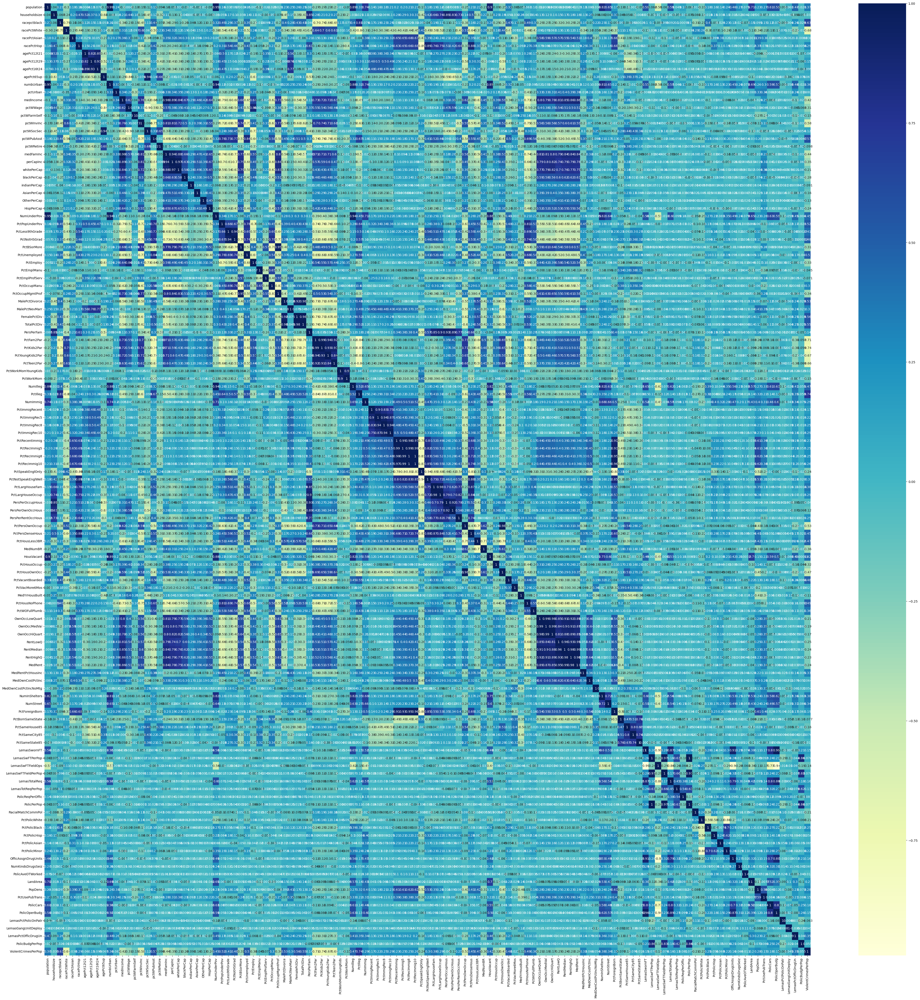

In [48]:
plt.figure(figsize = (55, 55))
sns.heatmap(correlation, cmap = "YlGnBu", annot = True)
plt.show()

#### (d) Calculate the Coefficient of Variation CV for each feature, where $CV = m/s$ , in which $s$ is sample standard deviation and $m$ is sample mean..

In [49]:
cv_results = {}  # Create an empty dictionary to store the coefficient of variation results

# Iterate through each column in the imputed_data DataFrame
for col in imputed_data.columns:
    # Calculate the mean (mu) of the current column
    mu = imputed_data[col].mean()
    
    # Calculate the sample standard deviation (sigma) of the current column
    sigma = imputed_data[col].std()
    
    # Calculate the coefficient of variation (cv) as sigma/mu
    cv_results[col] = [mu, sigma, sigma/mu]

# Create a DataFrame from the cv_results dictionary
cv_results = pd.DataFrame(cv_results)

# Set the index of the DataFrame to 'mu', 'std', and 'cv' to label the rows
cv_results.index = ['mu', 'std', 'cv']

# Display the resulting DataFrame with mean, standard deviation, and coefficient of variation
cv_results

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
mu,0.057593,0.463395,0.179629,0.753716,0.153681,0.144022,0.424218,0.493867,0.336264,0.423164,...,0.065231,0.232854,0.161685,0.163835,0.079895,0.710740,0.450052,0.094052,0.191445,0.237979
std,0.126906,0.163717,0.253442,0.244039,0.208877,0.232492,0.155196,0.143564,0.166505,0.179185,...,0.109459,0.203092,0.229055,0.085793,0.056023,0.085624,0.162153,0.240328,0.065815,0.232985
cv,2.203503,0.353298,1.410920,0.323782,1.359162,1.614278,0.365840,0.290693,0.495161,0.423442,...,1.678031,0.872187,1.416673,0.523655,0.701202,0.120471,0.360299,2.555266,0.343782,0.979015


#### (e) Plot √128 features with highest CV , and make scatter plots and box plots for them. Can you draw conclusions about significance of those features, just by the scatter plots?

In [50]:
# np.argsort(cv_results.iloc[2]) returns the indices that would sort the coefficient of variation (CV) values in ascending order
# [::-1] reverses the order to sort in descending order
# [:math.floor(math.sqrt(128))] selects the first 'k' features, where 'k' is the square root of 128

sort_index = np.argsort(cv_results.iloc[2])[::-1][:math.floor(math.sqrt(128))]

# selected_columns contains the names of the selected features based on the calculated indices
selected_columns = imputed_data.columns[sort_index]

# Display a message indicating the selected features
print('Selected features:')

# cv_results[selected_columns][2:].T extracts the relevant rows (mean, standard deviation, CV) of the selected columns
# and transposes the DataFrame for a more readable display
cv_results[selected_columns][2:].T

Selected features:


,cv
NumStreet,4.407702
NumInShelters,3.485481
NumIlleg,2.994196
NumImmig,2.900497
LemasPctOfficDrugUn,2.555266
NumUnderPov,2.304970
population,2.203503
numbUrban,2.001744
HousVacant,1.958780
LandArea,1.678031


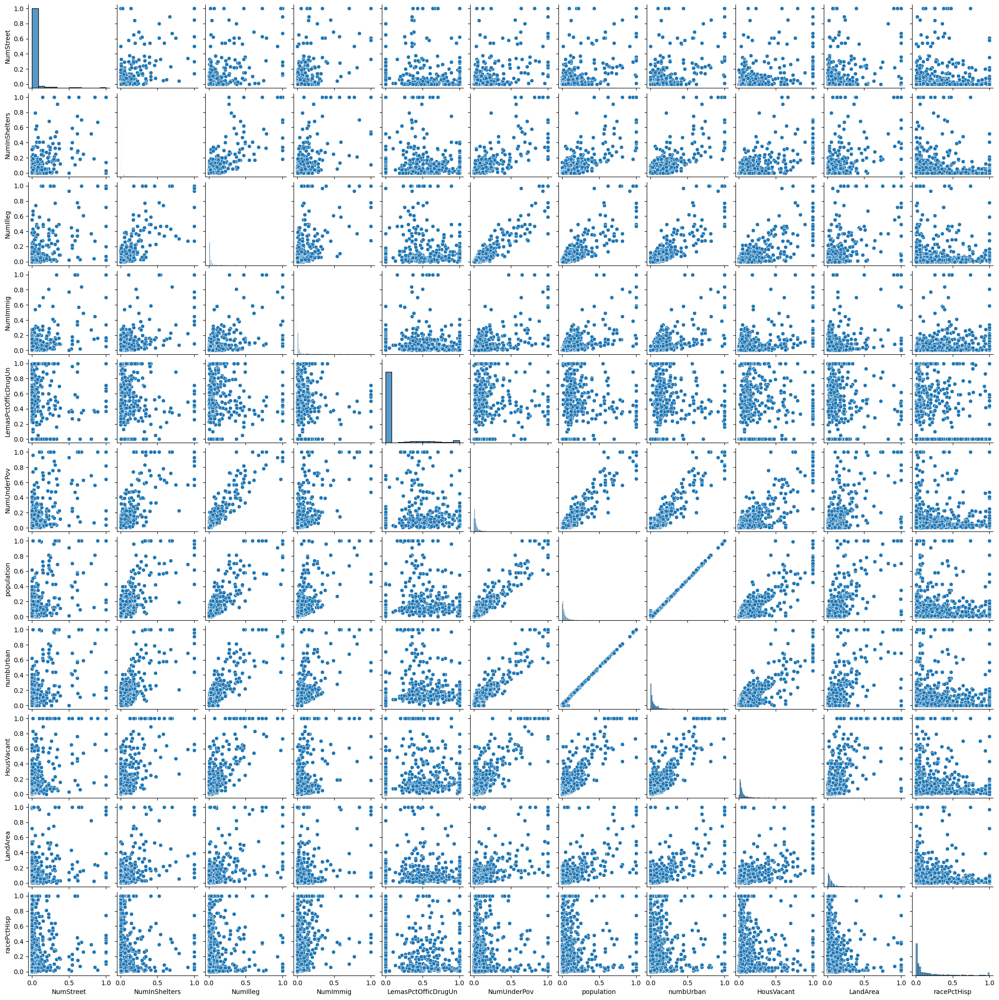

In [51]:
sns.pairplot(data = imputed_data[selected_columns], height = 2)

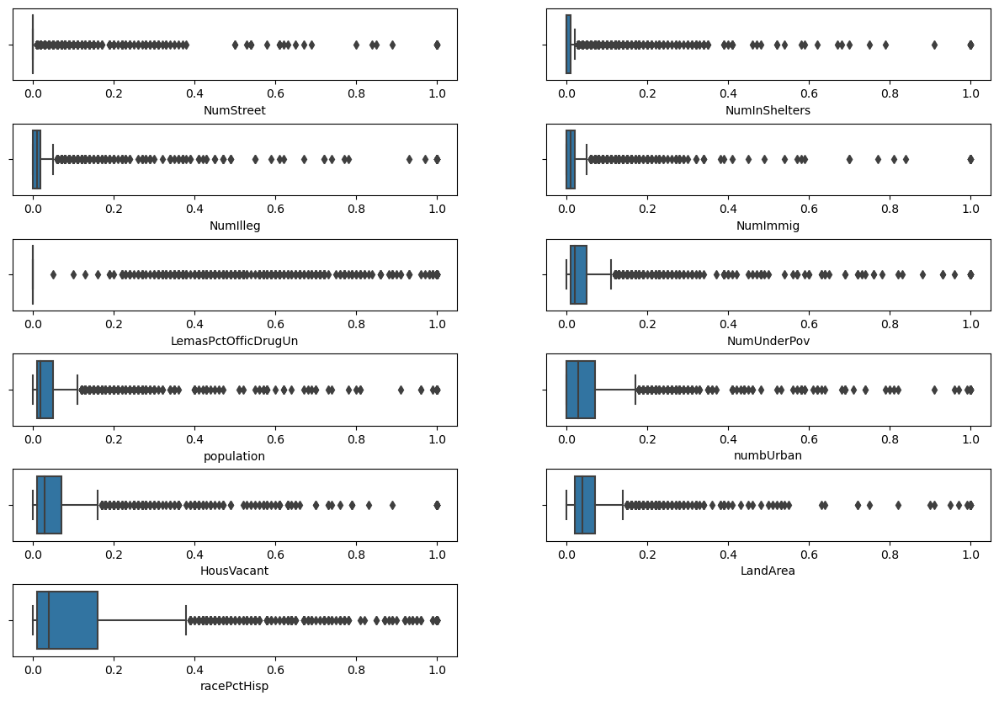

In [52]:
# Create a figure with a specified size
plt.figure(figsize=(15, 10))

# Iterate over the selected columns and their indices
for i, col in enumerate(selected_columns):
    # Create subplots in a grid format (rows, columns, index)
    plt.subplot(int(len(selected_columns) / 2) + 1, 2, i + 1)
    
    # Create a box plot for the current column 'col' using seaborn (sns)
    sns.boxplot(x=col, data=imputed_data)

# Adjust the spacing between subplots horizontally and vertically
plt.subplots_adjust(wspace=0.2, hspace=0.6)


> **Findings:** 
> - When analyzing the scatterplots of the data, it is evident that the data points are completely scattered , and we cannot draw meaningful conclusions solely from the scatterplots.
> - To gain more insights from the data, we complemented the scatterplots with box plots, which provide information about the distribution of data within each column.
> - While the scatterplots alone didn't provide meaningful insights, the combination of scatterplots and box plots  can allow us to identify potentially significant features that can be used to improve predictive models or draw conclusions related to the dataset.

#### (f) Fit a linear model using least squares to the training set and report the test error.

In [53]:
# splitting label
train_x, train_y = imputed_train_data.iloc[:, :-1], imputed_train_data.iloc[:, -1:]
test_x, test_y = imputed_test_data.iloc[:, :-1], imputed_test_data.iloc[:, -1:]

# training the model
train_x = sm.add_constant(train_x)
model = sm.OLS(train_y, train_x).fit()
print(model.summary())

# training mse
pred_train_y = model.predict(train_x)
mse_train = round(mean_squared_error(train_y, pred_train_y), 5)

# testing mse
test_x = sm.add_constant(test_x)
pred_test_y = model.predict(test_x)
mse_test = round(mean_squared_error(test_y, pred_test_y), 5)

                             OLS Regression Results                            
Dep. Variable:     ViolentCrimesPerPop   R-squared:                       0.711
Model:                             OLS   Adj. R-squared:                  0.686
Method:                  Least Squares   F-statistic:                     27.94
Date:                 Fri, 27 Oct 2023   Prob (F-statistic):          6.56e-291
Time:                         22:37:16   Log-Likelihood:                 955.40
No. Observations:                 1495   AIC:                            -1667.
Df Residuals:                     1373   BIC:                            -1019.
Df Model:                          121                                         
Covariance Type:             nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const               

In [54]:
print("Training MSE: {}".format(mse_train))
print("Testing MSE : {}".format(mse_test))

Training MSE: 0.01631
Testing MSE : 0.01814


#### (g) Fit a ridge regression model on the training set, with λ chosen by cross-validation. Report the test error obtained.

In [55]:
def ridge_regression(train_x, train_y, test_x, test_y, is_std=False, is_ridge=False):
    # Define a list of alpha (λ) values for regularization
    alphas = [10**i for i in range(-10, 10)]
    
    # Select the appropriate model based on is_ridge parameter
    if is_ridge:
        model = RidgeCV(cv=KFold(n_splits=5, random_state=50, shuffle=True))
    else:
        model = LassoCV(cv=KFold(n_splits=5, random_state=50, shuffle=True))
    
    # Apply standardization to the data if is_std is True
    if is_std:
        scaler = StandardScaler()
        train_x = scaler.fit_transform(train_x)
        test_x = scaler.fit_transform(test_x)
        
    # Fit (train) the selected model on the training data
    model.fit(train_x, train_y)
    
    # Make predictions on the test data
    pred_test_y = model.predict(test_x)
    
    # Determine the best alpha (λ) based on cross-validation
    best_alpha = model.alpha_
    
    # Calculate the Mean Squared Error (MSE) for the test predictions
    mse_test = round(mean_squared_error(test_y, pred_test_y), 5)

    # Print the results
    print("Best Alpha (lambda): {}".format(best_alpha))
    print("Test MSE: {}".format(mse_test))
    
    return model

# Call the function for Ridge regression
model = ridge_regression(train_x, train_y, test_x, test_y, is_ridge=True)


Best Alpha (lambda): 1.0
Test MSE: 0.01773


#### (h) Fit a LASSO model on the training set, with λ chosen by cross-validation. Report the test error obtained, along with a list of the variables selected by the model. Repeat with standardized4 features. Report the test error for both cases and compare them.

In [56]:
# Define a function to get selected features based on model coefficients
def extract_nonzero_coeff_features(model, features):
    selected_features = []
    
    # Iterate through the features and their corresponding coefficients
    for i in range(len(features)):
        if (model.coef_[i] != 0):
            selected_features.append([features[i], model.coef_[i]])
    
    return selected_features

# Call the ridge_regression function to train the model
model = ridge_regression(train_x, train_y, test_x, test_y)

# Get the selected features using the trained model and feature names
selected_features = extract_nonzero_coeff_features(model, train_x.columns)

# Print the total number of selected features and the list of selected features
print("\nTotal selected feature: {}".format(len(selected_features)))
selected_features


Best Alpha (lambda): 9.421060424823112e-05
Test MSE: 0.0178

Total selected feature: 78


[['racepctblack', 0.27339565215121264],
 ['racePctAsian', -0.01867534079232011],
 ['agePct12t21', 0.07903300380532398],
 ['agePct12t29', -0.3000594636937193],
 ['agePct65up', 0.005874478335867003],
 ['pctUrban', 0.04121588729265733],
 ['pctWWage', -0.09621516487475036],
 ['pctWFarmSelf', 0.02999147522667151],
 ['pctWInvInc', -0.11446327312435621],
 ['pctWSocSec', 0.06248285967929005],
 ['pctWPubAsst', 0.043196865532899115],
 ['pctWRetire', -0.11028468782489498],
 ['whitePerCap', -0.07374673344489037],
 ['blackPerCap', -0.02311802269330309],
 ['indianPerCap', -0.032231597479407716],
 ['AsianPerCap', 0.029330630177399838],
 ['OtherPerCap', 0.024019511001171973],
 ['HispPerCap', 0.026225557917161087],
 ['PctPopUnderPov', -0.15368755744835202],
 ['PctLess9thGrade', -0.022307225000511736],
 ['PctBSorMore', 0.02393921228331618],
 ['PctEmploy', 0.1613807904899726],
 ['PctEmplManu', -0.020493090605291538],
 ['PctOccupManu', 0.018995480901955023],
 ['MalePctDivorce', 0.13794150863654125],
 ['Ma

In [57]:
model = ridge_regression(train_x, train_y, test_x, test_y, is_std = True)
selected_features = extract_nonzero_coeff_features(model, train_x.columns)
print("\nTotal selected feature: {}".format(len(selected_features)))
selected_features

Best Alpha (lambda): 0.0007116541214377484
Test MSE: 0.01801

Total selected feature: 73


[['racepctblack', 0.06858870925793538],
 ['racePctAsian', -0.00136062847677207],
 ['agePct12t21', 0.011291618767082616],
 ['agePct12t29', -0.0402216745675996],
 ['pctUrban', 0.0168024730421782],
 ['pctWWage', -0.013003159360660446],
 ['pctWFarmSelf', 0.004377856493284323],
 ['pctWInvInc', -0.021216410951677665],
 ['pctWSocSec', 0.009385458078625218],
 ['pctWPubAsst', 0.006704066693142009],
 ['pctWRetire', -0.017503921502788435],
 ['whitePerCap', -0.00948739142187649],
 ['blackPerCap', -0.0037525679590309394],
 ['indianPerCap', -0.005283808296876048],
 ['AsianPerCap', 0.005382140875924134],
 ['OtherPerCap', 0.0038952119702655085],
 ['HispPerCap', 0.00420566272191332],
 ['PctPopUnderPov', -0.027938158086610397],
 ['PctLess9thGrade', -0.002534726164851397],
 ['PctEmploy', 0.02265654343113568],
 ['PctEmplManu', -0.0012749096237329833],
 ['MalePctDivorce', 0.01994106897378662],
 ['MalePctNevMarr', 0.022100135698349666],
 ['FemalePctDiv', -0.011719460251362076],
 ['PctKids2Par', -0.040033382

> **Findings:**  
>The test mean squared error (MSE) for the trained model is quite similar whether we use standardized or non-standardized data. It seems, the non-standardized data even exhibits slightly lower test MSE compared to the standardized data.

#### (i) Fit a PCR model on the training set, with M (the number of principal components) chosen by cross-validation. Report the test error obtained.


Principal Component Regression (PCR) is a statistical technique for regression analysis that is used to reduce the dimensionality of a dataset by projecting it onto a lower-dimensional subspace. 

In [58]:
def pcr_model(train_x, train_y, test_x, test_y):
    result_scores = []
    # Loop through a range of PCA components
    for i in range(1, 1 + len(train_x.columns)):
        model_pca = PCA(n_components=i)  # Create a PCA model with 'i' components
        model_lr = LinearRegression(fit_intercept=True)  # Create a Linear Regression model
        # Use cross-validation to evaluate the model's performance
        scores = cross_val_score(make_pipeline(model_pca, model_lr), train_x, train_y,
                                 cv=KFold(5, shuffle=True, random_state=50),
                                 n_jobs=-1, scoring="neg_mean_squared_error")
        # Calculate the average absolute MSE and store it
        result_scores.append(round(sum(abs(scores)) / len(scores), 5))
    return result_scores

# Get the cross-validation scores for different numbers of components
scores = pcr_model(train_x, train_y, test_x, test_y)
# Find the minimum cross-validation error and the number of components that achieved it
minimum_error = scores[np.argmin(scores)]
components = np.argmin(scores) + 1

# Create a PCA model with the selected number of components
model_pca = PCA(n_components=components).fit(train_x)
# Transform the training and testing data using PCA
pca_train = model_pca.transform(train_x)
pca_test = model_pca.transform(test_x)
# Fit a Linear Regression model on the transformed training data
model_lr = LinearRegression().fit(pca_train, train_y)
# Predict test data
pred_test_y = model_lr.predict(pca_test)
# Calculate test mean squared error
mse_test = round(mean_squared_error(test_y, pred_test_y), 5)

# Print results
print("Minimum CV Training Error: {}".format(minimum_error))
print("Selected components       : {}".format(components))
print("Testing MSE              : {}".format(mse_test))


Minimum CV Training Error: 0.01946
Selected components       : 94
Testing MSE              : 0.01852


#### (j) In this section, we would like to fit a boosting tree to the data. As in classification trees, one can use any type of regression at each node to build a multivariate regression tree. Because the number of variables is large in this problem, one can use L1-penalized regression at each node. Such a tree is called L1 penalized gradient boosting tree. You can use XGBoost to fit the model tree. Determine α (the regularization term) using cross-validation.

 XGBoost (Extreme Gradient Boosting) is used for classification and regression tasks. It's known for its high performance and efficiency. XGBoost builds an ensemble of decision trees to make predictions and includes some advanced features like regularization to prevent overfitting. 

In [59]:
def boosting_tree(train_x, train_y, test_x, test_y):
    result_scores = []
    alphas = [i for i in range(0, 100)]  # Range of alpha values to try
    for alpha in alphas:
        model = xgb.XGBRegressor(reg_alpha=alpha, random_state=50)
        # Use cross-validation to evaluate the model's performance
        score = cross_val_score(model, train_x, train_y,
                                cv=KFold(5, shuffle=True, random_state=50),
                                n_jobs=-1, scoring="neg_mean_squared_error")
        # Calculate the average absolute MSE and store it
        result_scores.append(round(sum(abs(score)) / len(score), 5))
    return result_scores, alphas

# Get the cross-validation scores for different alpha values
result_scores, alphas = boosting_tree(train_x, train_y, test_x, test_y)

# Find the minimum cross-validation error and the alpha value that achieved it
minimum_error = result_scores[np.argmin(result_scores)]
best_alpha = alphas[np.argmin(result_scores)]

# Create an XGBoost model with the best alpha value
model = xgb.XGBRegressor(reg_alpha=best_alpha, random_state=50)
model.fit(train_x, train_y)
# Predict test data
pred_test_y = model.predict(test_x)
# Calculate test mean squared error
mse_test = round(mean_squared_error(test_y, pred_test_y), 5)

# Print results
print("Minimum CV Training Error: {}".format(minimum_error))
print("Best Alpha (Lambda)      : {}".format(best_alpha))
print("Testing MSE              : {}".format(mse_test))


Minimum CV Training Error: 0.02061
Best Alpha (Lambda)      : 2
Testing MSE              : 0.01861


#### References
- https://www.geeksforgeeks.org/decision-tree/
- https://www.analyticsvidhya.com/blog/2020/10/cost-complexity-pruning-decision-trees/
- https://www.geeksforgeeks.org/principal-component-regression-pcr/
- https://www.analyticsvidhya.com/blog/2018/09/an-end-to-end-guide-to-understand-the-math-behind-xgboost/
- https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html
- https://scikit-learn.org/stable/modules/generated/sklearn.pipeline.make_pipeline.html